In [1]:
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as anim
from matplotlib.colors import LogNorm
from IPython.display import Image, display

In [ ]:
DATA_DIR = Path('../code-local/output_parallel/')         
PATTERN = 'global_step_*.bin'      
SX, SY = 256, 256            

files = sorted(Path(DATA_DIR).glob(PATTERN))
if not files:
    raise FileNotFoundError(f'No files found in {DATA_DIR} matching {PATTERN!r}')
print(f'Found {len(files)} frames. First: {files[0].name}, Last: {files[-1].name}')

def load_frame_by_index(k: int) -> np.ndarray:
    """Load frame k (0-based) and reshape to (SY, SX) as float32."""
    f = files[k]
    arr = np.fromfile(f, dtype=np.float32)
    expected = SX * SY
    if arr.size != expected:
        raise ValueError(f'File {f} has {arr.size} floats; expected {expected} = SX*SY. '
                         f'Check SX,SY or the file pattern.')
    return arr.reshape(SY, SX)

Found 300 frames. First: global_step_00000.bin, Last: global_step_00299.bin


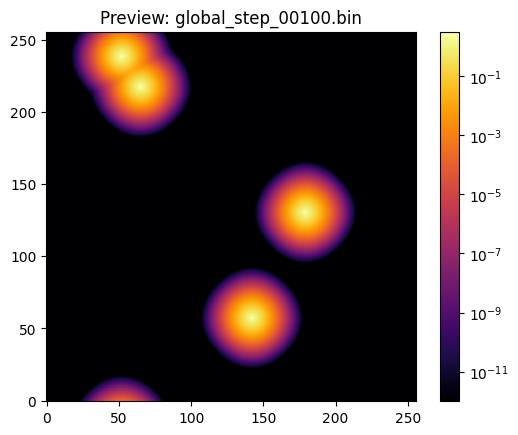

In [ ]:
# single frame
k_preview = 100  
arr = load_frame_by_index(k_preview)
arr = np.maximum(arr, 1e-12)

plt.figure()
norm = LogNorm()
im = plt.imshow(arr, origin='lower', aspect='equal', norm=norm, cmap='inferno')
plt.colorbar()
plt.title(f'Preview: {files[k_preview].name}')
plt.show()

Saved GIF → evolution.gif


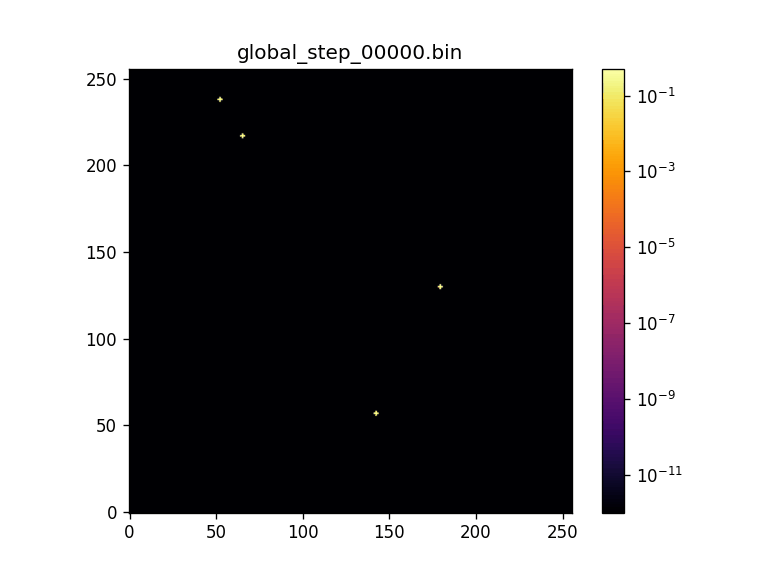

In [ ]:
# GIF animation
ANIM_FPS = 12         
OUT_GIF = 'evolution.gif'    

first = load_frame_by_index(0)
first = np.maximum(first, 1e-12)

fig = plt.figure()
norm = LogNorm() 
im = plt.imshow(first, origin='lower', aspect='equal', norm=norm, cmap='inferno')
plt.colorbar()
plt.title(files[0].name)

def update(frame_idx):
    arr = load_frame_by_index(frame_idx)
    arr = np.maximum(arr, 1e-12)
    im.set_array(arr)
    plt.title(files[frame_idx].name)
    return [im]

ani = anim.FuncAnimation(fig, update, frames=len(files), interval=1000/ANIM_FPS, blit=False)
ani.save(OUT_GIF, dpi=120, writer='pillow')
plt.close(fig)

display(Image(filename=OUT_GIF))
